# **Import Dataset**

In [ ]:
import kagglehub
obulisainaren_multi_cancer_path = kagglehub.dataset_download('obulisainaren/multi-cancer')

print('Data source import complete.')


Data source import complete.


# **Import Library**

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
import tensorflow as tf
from tensorflow.keras.models import Model ,load_model
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications import ResNet101, ResNet50
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras import regularizers
from sklearn.metrics import classification_report, confusion_matrix

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# **Menampilkan Dataset**

## **Visualisasi Gambar**

In [ ]:
dataset_path = '/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer'

In [ ]:
cervix_categories = ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']

image_counts = {}

for category in cervix_categories:
    category_path = os.path.join(dataset_path, category)
    image_counts[category] = len(os.listdir(category_path))

for category, count in image_counts.items():
    print(f"Total {category} images: {count}")

def display_samples(image_paths, title, num_samples=3):
    plt.figure(figsize=(15, 5))
    for i in range(num_samples):
        img_path = image_paths[i]
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img_rgb)
        plt.title(f"{title} {i + 1}")
        plt.axis('off')
    plt.show()

for category in cervix_categories:
    category_path = os.path.join(dataset_path, category)
    images_list = os.listdir(category_path)
    display_samples([os.path.join(category_path, img) for img in images_list[:3]], f"{category} Sample Image")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
data_dir='/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer'
target_folder='Cervical Cancer'
filepath=[]
labels=[]
all_folder_path = os.path.join(data_dir, target_folder)

if os.path.isdir(all_folder_path):
    filelist = os.listdir(all_folder_path)
    for f in filelist:
        fpath = os.path.join(all_folder_path, f)
        fipath=os.listdir(fpath)
        for image in fipath:
            path = os.path.join(fpath, image)
            filepath.append(path)
            labels.append(f)

f_series = pd.Series(filepath, name='filepath')
l_series = pd.Series(labels, name='labels')
df = pd.concat([f_series, l_series], axis=1)
print(df.head())

print(df.dtypes)

print(df.isnull().sum())

print(df.describe())

                                            filepath      labels
0  /kaggle/input/multi-cancer/Multi Cancer/Multi ...  cervix_koc
1  /kaggle/input/multi-cancer/Multi Cancer/Multi ...  cervix_koc
2  /kaggle/input/multi-cancer/Multi Cancer/Multi ...  cervix_koc
3  /kaggle/input/multi-cancer/Multi Cancer/Multi ...  cervix_koc
4  /kaggle/input/multi-cancer/Multi Cancer/Multi ...  cervix_koc
filepath    object
labels      object
dtype: object
filepath    0
labels      0
dtype: int64
                                                 filepath      labels
count                                               25000       25000
unique                                              25000           5
top     /kaggle/input/multi-cancer/Multi Cancer/Multi ...  cervix_koc
freq                                                    1        5000


In [ ]:
df

,filepath,labels
0,/kaggle/input/multi-cancer/Multi Cancer/Multi ...,cervix_koc
1,/kaggle/input/multi-cancer/Multi Cancer/Multi ...,cervix_koc
2,/kaggle/input/multi-cancer/Multi Cancer/Multi ...,cervix_koc
3,/kaggle/input/multi-cancer/Multi Cancer/Multi ...,cervix_koc
4,/kaggle/input/multi-cancer/Multi Cancer/Multi ...,cervix_koc
...,...,...
24995,/kaggle/input/multi-cancer/Multi Cancer/Multi ...,cervix_mep
24996,/kaggle/input/multi-cancer/Multi Cancer/Multi ...,cervix_mep
24997,/kaggle/input/multi-cancer/Multi Cancer/Multi ...,cervix_mep
24998,/kaggle/input/multi-cancer/Multi Cancer/Multi ...,cervix_mep


In [ ]:
counts=df['labels'].value_counts()
counts

,count
labels,
cervix_koc,5000
cervix_dyk,5000
cervix_pab,5000
cervix_sfi,5000
cervix_mep,5000


# **Pre-Processing**

## **Cek Balancing**

/tmp/ipython-input-1726382234.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=counts.index, y=counts.values, palette=palette)


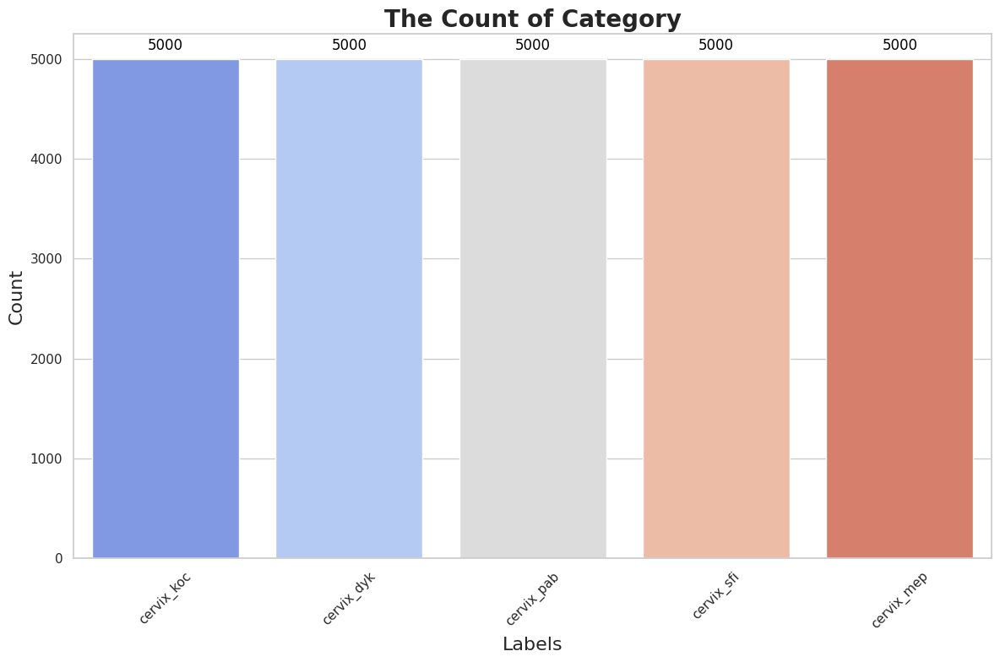

In [ ]:
sns.set(style="whitegrid")
palette = sns.color_palette("coolwarm", n_colors=len(counts))

plt.figure(figsize=(12, 8))
bar_plot = sns.barplot(x=counts.index, y=counts.values, palette=palette)

plt.title('The Count of Category', fontsize=20, fontweight='bold')
plt.xlabel('Labels', fontsize=16)
plt.ylabel('Count', fontsize=16)

for p in bar_plot.patches:
    bar_plot.annotate(f'{int(p.get_height())}',
                      (p.get_x() + p.get_width() / 2., p.get_height()),
                      ha='center', va='bottom',
                      fontsize=12, color='black',
                      xytext=(0, 5),
                      textcoords='offset points')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# **Train-Test Split**

In [ ]:
strat=df['labels']
train_df ,dummy_df=train_test_split(df,test_size=0.3,random_state=42,stratify=strat)
strate=dummy_df['labels']
valid_df,test_df=train_test_split(dummy_df,test_size=0.5,random_state=42,stratify=strate)

In [ ]:
print(train_df.shape)
print(valid_df.shape)
print(test_df.shape)

(17500, 2)
(3750, 2)
(3750, 2)


**-------------------------------------------------------------------------------------**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from tensorflow.keras.models import load_model

# Ganti path sesuai lokasi file di Drive kamu
model_path = '/content/drive/MyDrive/end2A_model.keras'
model = load_model(model_path)


In [ ]:
from tensorflow.keras.models import load_model

# Load model from Google Drive
end_model = load_model('/content/drive/MyDrive/end2A_model.keras')

test_loss, test_accuracy = end_model.evaluate(test_gen, verbose=2)

print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


59/59 - 61s - 1s/step - accuracy: 0.9973 - loss: 0.0064
Test Loss: 0.0064
Test Accuracy: 0.9973


In [ ]:
# --- 3️⃣ Fine-tuning beberapa layer terakhir (Layer-wise fine-tuning) ---
for layer in model.layers[:-5]:  # freeze semua layer kecuali 5 terakhir
    layer.trainable = False
for layer in model.layers[-5:]:
    layer.trainable = True

model.compile(optimizer=Adamax(1e-5), loss='categorical_crossentropy', metrics=['accuracy'])


## **Normalisasi Pixel, Resize**

ubah dikit bagian :

img_shape = (img_size[0], img_size[1], channels)
AUTOTUNE = tf.data.AUTOTUNE

Train generator
tr_gen = ImageDataGenerator(
    preprocessing_function=preprocess_input   # Normalisasi pixel sesuai ImageNet
)

Validation & Test generator
ts_gen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

In [ ]:
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

batch_size = 64
img_size = (224, 224)
channels = 3


# Train generator
tr_gen = ImageDataGenerator(
    preprocessing_function=preprocess_input   # Normalisasi pixel sesuai ImageNet
)

# Validation & Test generator
ts_gen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_gen = tr_gen.flow_from_dataframe(
    train_df,
    x_col='filepath',
    y_col='labels',
    target_size=img_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True,
    batch_size=batch_size
)

valid_gen = ts_gen.flow_from_dataframe(
    valid_df,
    x_col='filepath',
    y_col='labels',
    target_size=img_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True,
    batch_size=batch_size
)

test_gen = ts_gen.flow_from_dataframe(
    test_df,
    x_col='filepath',
    y_col='labels',
    target_size=img_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False,
    batch_size=batch_size
)


Found 17500 validated image filenames belonging to 5 classes.
Found 3750 validated image filenames belonging to 5 classes.
Found 3750 validated image filenames belonging to 5 classes.


In [ ]:
# --- 5️⃣ Callbacks ---
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_checkpoint = ModelCheckpoint("fine_tuned_model2A.keras", monitor='val_loss', save_best_only=True, verbose=1)

In [ ]:
# --- 6️⃣ Fine-tuning training ---
history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=30,
    callbacks=[early_stopping, model_checkpoint]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 690ms/step - accuracy: 0.9945 - loss: 0.0173
Epoch 1: val_loss improved from inf to 0.00337, saving model to fine_tuned_model2A.keras
274/274 ━━━━━━━━━━━━━━━━━━━━ 266s 895ms/step - accuracy: 0.9945 - loss: 0.0173 - val_accuracy: 0.9989 - val_loss: 0.0034
Epoch 2/30
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step - accuracy: 0.9952 - loss: 0.0211
Epoch 2: val_loss did not improve from 0.00337
274/274 ━━━━━━━━━━━━━━━━━━━━ 112s 374ms/step - accuracy: 0.9952 - loss: 0.0211 - val_accuracy: 0.9989 - val_loss: 0.0034
Epoch 3/30
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step - accuracy: 0.9955 - loss: 0.0150
Epoch 3: val_loss did not improve from 0.00337
274/274 ━━━━━━━━━━━━━━━━━━━━ 105s 383ms/step - accuracy: 0.9955 - loss: 0.0150 - val_accuracy: 0.9989 - val_loss: 0.0034
Epoch 4/30
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step - accuracy: 0.9956 - loss: 0.0164
Epoch 4: val_loss did not improve from 0.00337
274/274 ━━━━━━━━━━━━━━━━━━━━ 107s 389ms/step - accuracy

**--------------------------------------------------------------------------------------------------**

# **Training**

mengganti Flatten()

In [ ]:
base_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = False

model3 = Sequential([
    base_model,
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.25),
    Dense(64, activation='relu'),
    Dropout(0.25),
    Dense(5, activation='softmax')
])

optimizer = Adamax(learning_rate=0.002)
model3.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])



## **ResNet101**

Menambah save .keras

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

model_checkpoint = ModelCheckpoint(
    'end2A_model.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

history = model3.fit(
     train_gen,
     epochs=50,
     validation_data=valid_gen,
     shuffle=False,
     callbacks=[early_stopping, model_checkpoint],
     validation_steps=None
)

model3.save("endstar2A_model.keras")
from google.colab import drive
drive.mount('/content/drive')

import shutil
shutil.copy("end2A_model.keras", "/content/drive/MyDrive/end2A_model.keras")
shutil.copy("endstar2A_model.keras", "/content/drive/MyDrive/endstar2A_model.keras")

import pickle
with open("history.pkl", "wb") as f:
    pickle.dump(history.history, f)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step - accuracy: 0.5575 - loss: 5.0340
Epoch 1: val_loss improved from inf to 0.33484, saving model to end2A_model.keras
274/274 ━━━━━━━━━━━━━━━━━━━━ 150s 473ms/step - accuracy: 0.5578 - loss: 5.0232 - val_accuracy: 0.8840 - val_loss: 0.3348
Epoch 2/50
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step - accuracy: 0.8280 - loss: 0.5528
Epoch 2: val_loss improved from 0.33484 to 0.12684, saving model to end2A_model.keras
274/274 ━━━━━━━━━━━━━━━━━━━━ 110s 401ms/step - accuracy: 0.8281 - loss: 0.5525 - val_accuracy: 0.9520 - val_loss: 0.1268
Epoch 3/50
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step - accuracy: 0.9167 - loss: 0.2861
Epoch 3: val_loss improved from 0.12684 to 0.06585, saving model to end2A_model.keras
274/274 ━━━━━━━━━━━━━━━━━━━━ 140s 395ms/step - accuracy: 0.9168 - loss: 0.2860 - val_accuracy: 0.9776 - val_loss: 0.0659
Epoch 4/50
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step - accuracy: 0.9471 - loss: 0.1678
Epoch 4: val_loss improved from

In [ ]:
# Tambah
from tensorflow.keras.models import load_model

# Load model terbaik dari file
model = load_model('end2A_model.keras')
print(model.summary())


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet101 (Functional)          │ (None, 7, 7, 2048)     │    42,658,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 119,779,601 (456.92 MB)

 Trainable params: 25,707,141 (98.06 MB)

 Non-trainable params: 42,658,176 (162.73 MB)

 Optimizer params: 51,414,284 (196.13 MB)

None


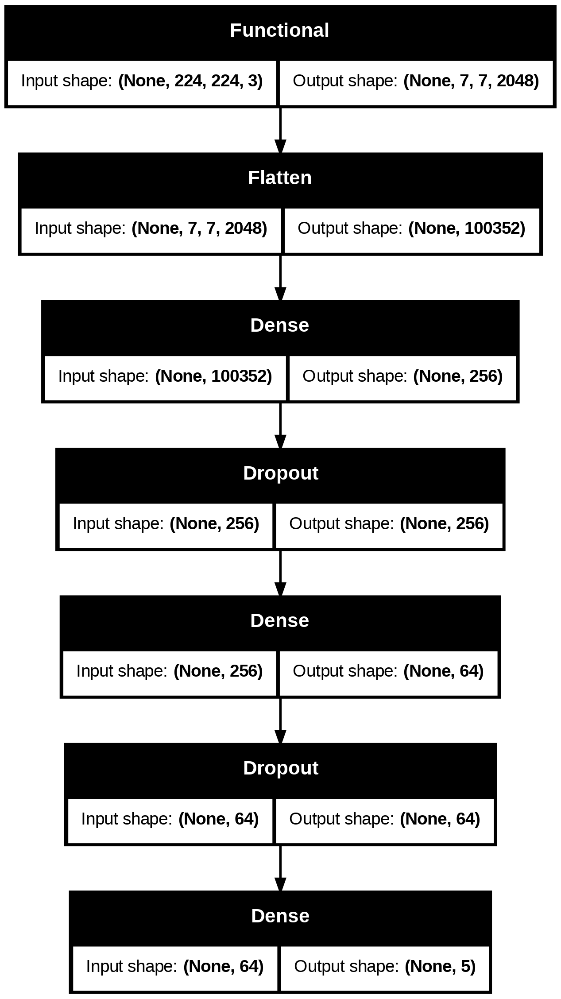

In [ ]:
tf.keras.utils.plot_model(model3,show_shapes=True)

In [ ]:
best_model = load_model('end2A_model.keras')

test_loss, test_accuracy = best_model.evaluate(test_gen, verbose=2)

print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


59/59 - 33s - 563ms/step - accuracy: 0.9973 - loss: 0.0064
Test Loss: 0.0064
Test Accuracy: 0.9973


In [ ]:
test_loss, test_accuracy = model3.evaluate(test_gen)
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.2f}')

59/59 ━━━━━━━━━━━━━━━━━━━━ 20s 331ms/step - accuracy: 0.9978 - loss: 0.0062
Test Loss: 0.0064
Test Accuracy: 1.00


59/59 ━━━━━━━━━━━━━━━━━━━━ 34s 458ms/step


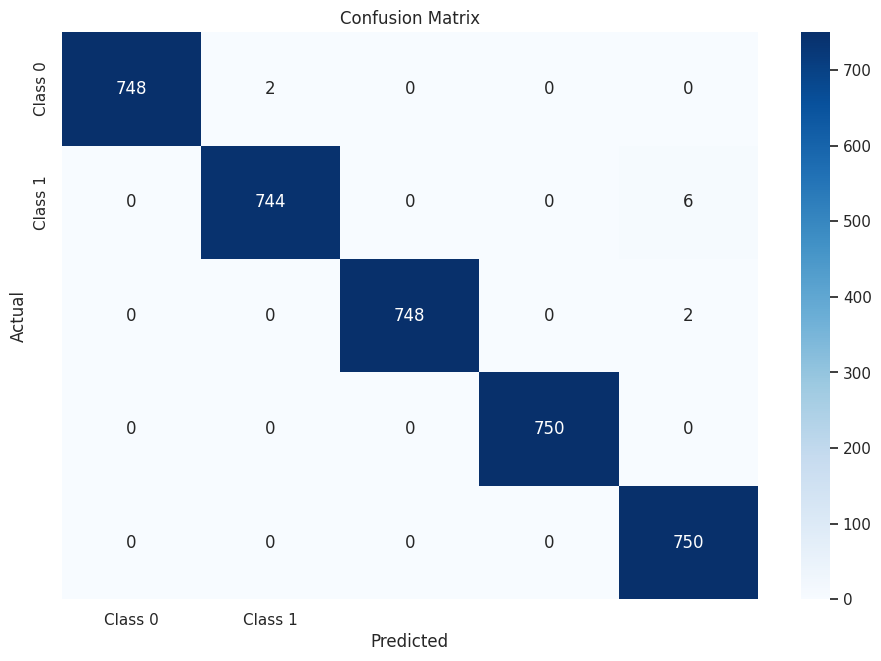

              precision    recall  f1-score   support

     Class 0       1.00      1.00      1.00       750
     Class 1       1.00      0.99      0.99       750
     Class 2       1.00      1.00      1.00       750
     Class 3       1.00      1.00      1.00       750
     Class 4       0.99      1.00      0.99       750

    accuracy                           1.00      3750
   macro avg       1.00      1.00      1.00      3750
weighted avg       1.00      1.00      1.00      3750



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

y_pred_prob = best_model.predict(test_gen)
y_pred_classes = np.argmax(y_pred_prob, axis=1)

y_true = test_gen.classes

cm = confusion_matrix(y_true, y_pred_classes)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

class_report = classification_report(y_true, y_pred_classes, target_names=["Class 0", "Class 1","Class 2","Class 3","Class 4"])
print(class_report)

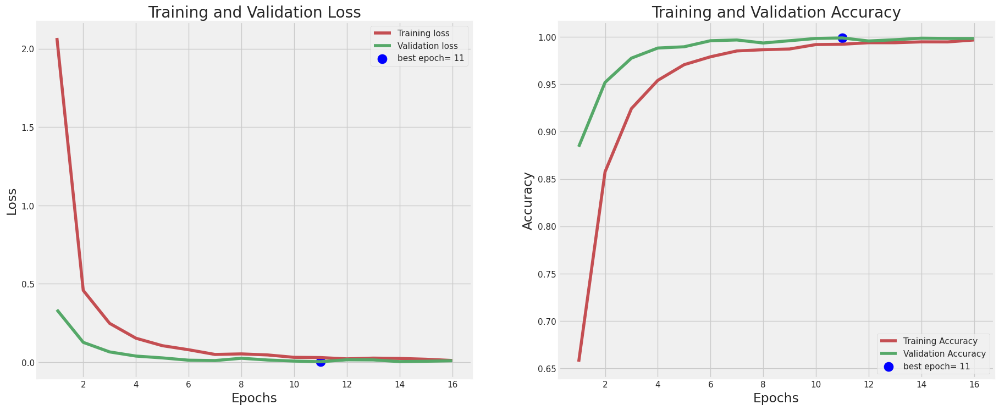

In [ ]:
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]

Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [ ]:
model3.save("Cervical Cancer End2A.h5")

Total cervix_dyk images: 5000
Total cervix_koc images: 5000
Total cervix_mep images: 5000
Total cervix_pab images: 5000
Total cervix_sfi images: 5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


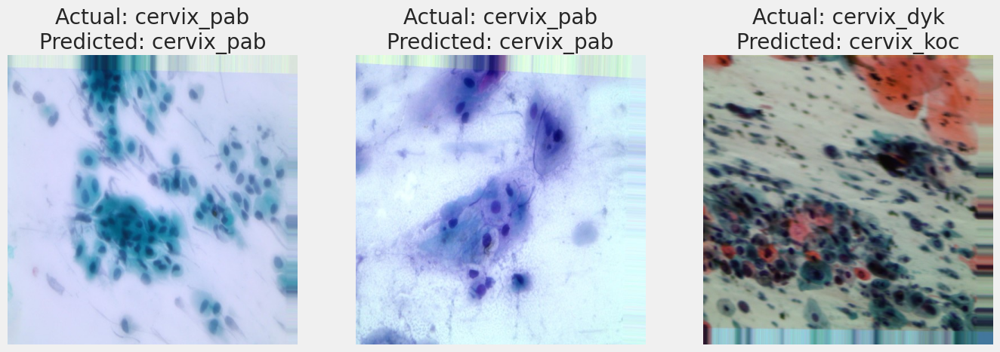

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


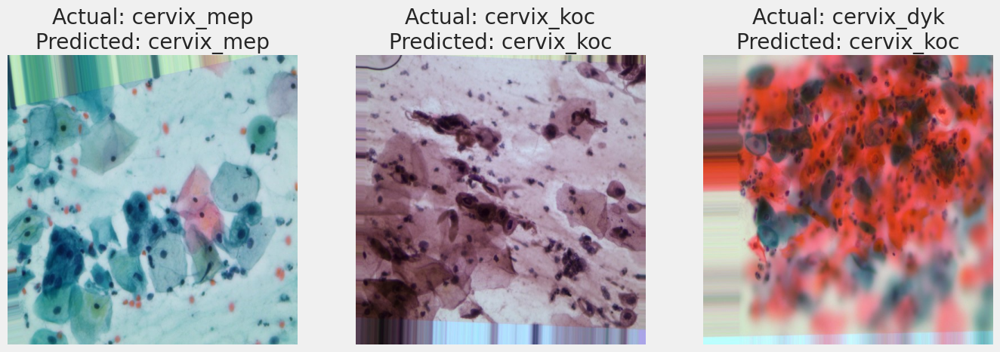

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


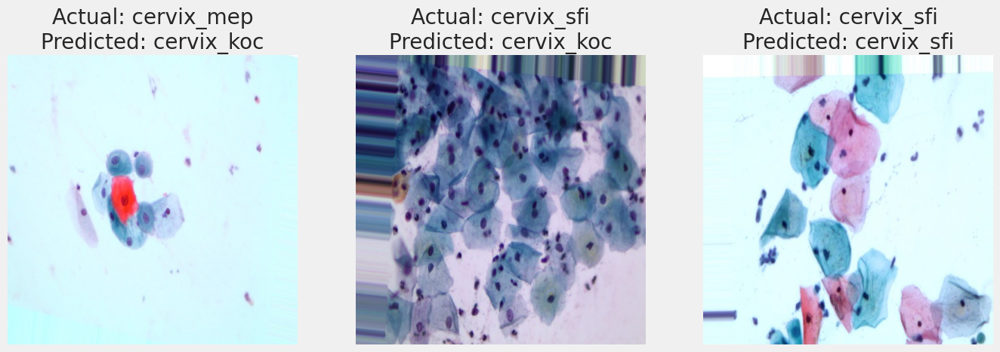

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


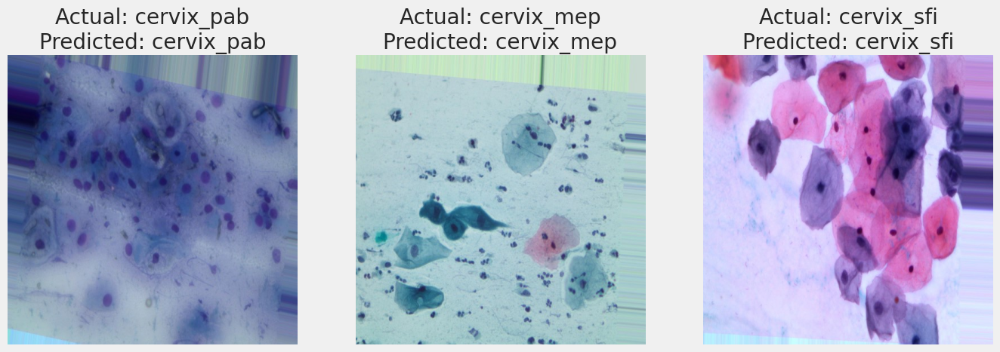

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


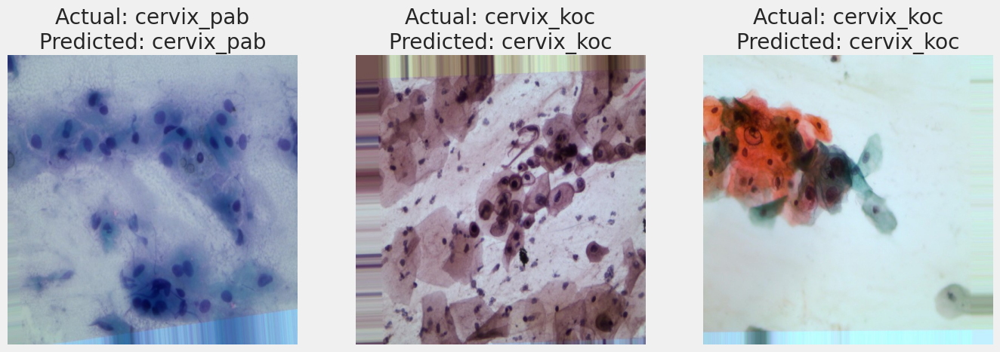

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

dataset_path = '/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer'
cervix_categories = ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']
num_classes = len(cervix_categories)

image_paths = []
actual_labels = []

for index, category in enumerate(cervix_categories):
    category_path = os.path.join(dataset_path, category)
    images_list = os.listdir(category_path)
    image_count = len(images_list)
    print(f"Total {category} images: {image_count}")

    image_paths.extend([os.path.join(category_path, img) for img in images_list])
    actual_labels.extend([index] * image_count)

def display_samples(image_paths, actual_labels, model, num_samples=3):
    selected_indices = np.random.choice(len(image_paths), num_samples, replace=False)
    plt.figure(figsize=(15, 5))

    for i, idx in enumerate(selected_indices):
        img_path = image_paths[idx]
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        img_resized = cv2.resize(img_rgb, (224, 224))
        img_array = np.expand_dims(img_resized, axis=0)

        prediction = model3.predict(img_array)
        predicted_label = np.argmax(prediction, axis=-1)[0]
        actual_label = actual_labels[idx]

        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img_rgb)
        plt.title(f"Actual: {cervix_categories[actual_label]}\nPredicted: {cervix_categories[predicted_label]}")
        plt.axis('off')
    plt.show()

for category in cervix_categories:
    display_samples(image_paths, actual_labels, model3)

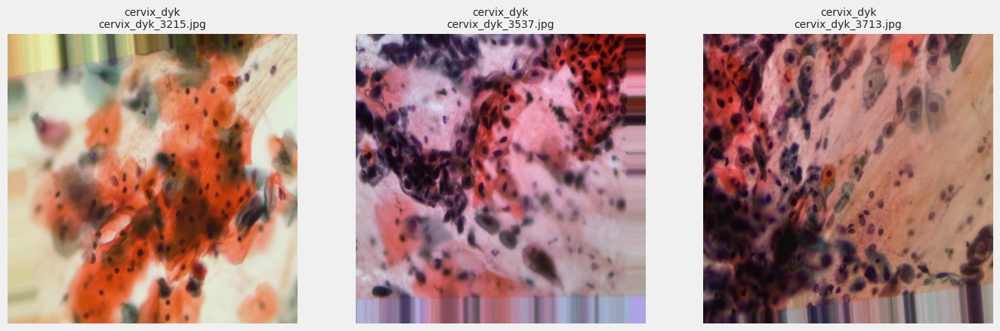

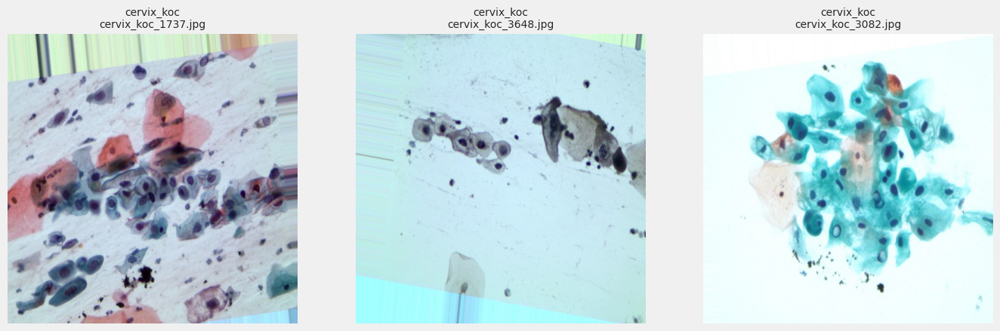

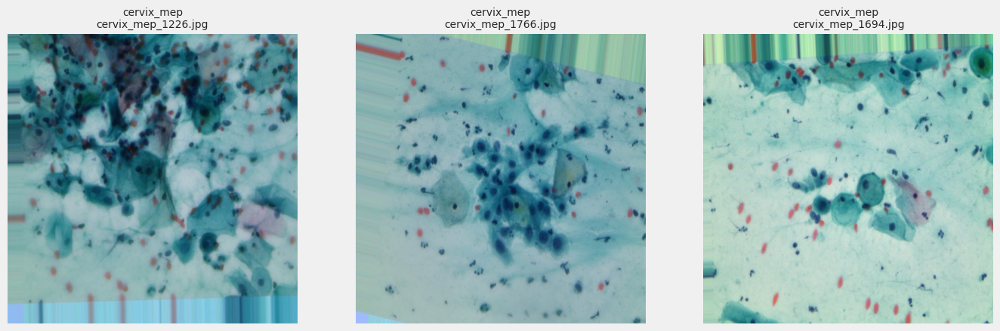

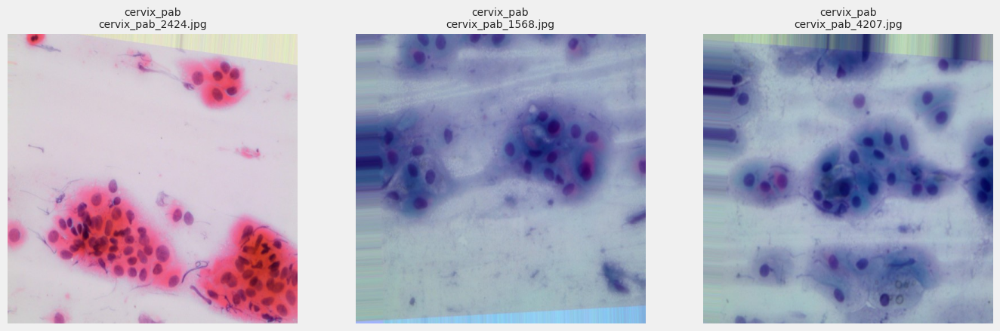

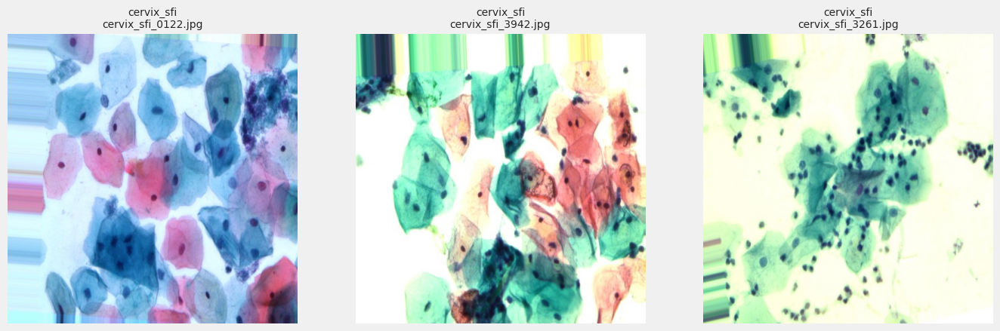

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

def display_samples_with_filename(image_paths, category, num_samples=3):
    plt.figure(figsize=(15, 5))
    for i in range(num_samples):
        img_path = image_paths[i]
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Ambil nama file
        file_name = os.path.basename(img_path)

        # Tampilkan gambar
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img_rgb)
        plt.title(f"{category}\n{file_name}", fontsize=10)
        plt.axis('off')
    plt.show()

# Menampilkan semua kategori dengan nama file
for category in cervix_categories:
    category_path = os.path.join(dataset_path, category)
    images_list = os.listdir(category_path)
    image_paths = [os.path.join(category_path, img) for img in images_list[:3]]
    display_samples_with_filename(image_paths, category)


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


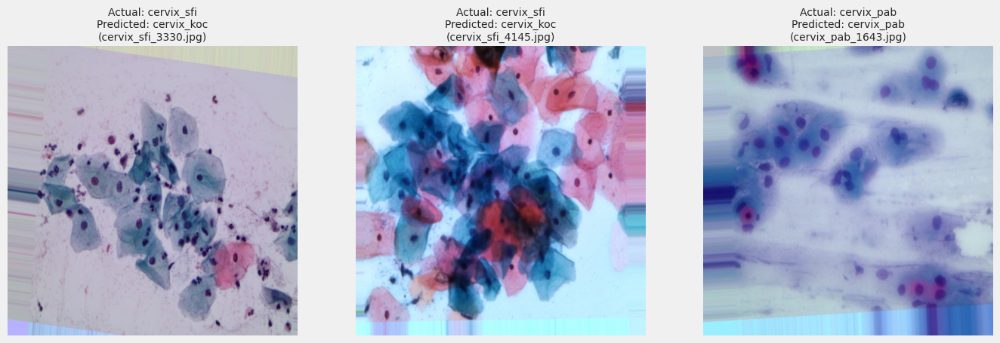

In [ ]:
def display_actual_predicted(image_paths, actual_labels, predicted_labels, num_samples=3):
    plt.figure(figsize=(15, 5))
    for i in range(num_samples):
        img_path = image_paths[i]
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        file_name = os.path.basename(img_path)

        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img_rgb)
        plt.title(f"Actual: {actual_labels[i]}\nPredicted: {predicted_labels[i]}\n({file_name})",
                  fontsize=10)
        plt.axis('off')
    plt.show()

# Select random samples from the test set
random_indices = np.random.choice(len(test_df), size=3, replace=False)
sample_paths = test_df.iloc[random_indices]['filepath'].tolist()
actuals_indices = test_df.iloc[random_indices]['labels'].apply(lambda x: cervix_categories.index(x)).tolist()
actuals = [cervix_categories[i] for i in actuals_indices]

# Get predictions for the selected samples
sample_images = [cv2.resize(cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB), (224, 224)) for path in sample_paths]
sample_images = np.array(sample_images)
predictions = model3.predict(sample_images)
predicted_indices = np.argmax(predictions, axis=1)
preds = [cervix_categories[i] for i in predicted_indices]

display_actual_predicted(sample_paths, actuals, preds)

In [ ]:
# 1. Cari last conv layer otomatis
last_conv_layer_name = None
for layer in reversed(model.layers):
    if 'conv' in layer.name and len(layer.output_shape) == 4:
        last_conv_layer_name = layer.name
        break

print("Last conv layer:", last_conv_layer_name)

# 2. Import preprocess_input sesuai arsitektur
from tensorflow.keras.applications.resnet import preprocess_input


Last conv layer: None


In [ ]:
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Flatten, GlobalAveragePooling2D

# Load backbone ResNet101 without fully connected layer
base_model = ResNet101(weights="imagenet", include_top=False, input_shape=(224,224,3))

# Load model lama (yang sudah kamu latih)
trained_model = load_model("/content/end2A_model.keras")

# Create a new model by connecting the base_model output to the layers after the base model in trained_model
x = base_model.output
# Add a Flatten layer before connecting to the dense layers
x = Flatten()(x)
# Connect the layers from the trained_model after the base_model
for layer in trained_model.layers[1:]: # Start from index 1 to skip the base_model layer
    x = layer(x)

final_model = Model(inputs=base_model.input, outputs=x)

final_model.summary()

Model: "functional_115"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_7[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 68,365,317 (260.79 MB)

 Trainable params: 68,259,973 (260.39 MB)

 Non-trainable params: 105,344 (411.50 KB)

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from google.colab import files

# Daftar nama kelas (ganti sesuai dataset kamu)
class_names = ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']

# Fungsi untuk prediksi
def predict_image(model, img_path, preprocess_func):
    img = image.load_img(img_path, target_size=(224, 224))  # Sesuaikan ukuran input model
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_func(img_array)

    preds = model.predict(img_array)
    predicted_class = np.argmax(preds[0])
    confidence = preds[0][predicted_class] * 100

    print(f"Prediksi: {class_names[predicted_class]} ({confidence:.2f}%)")

# Upload file
uploaded = files.upload()
for filename in uploaded.keys():
    predict_image(model, filename, preprocess_input)  # ganti preprocess_input sesuai model


Saving pab.png to pab (3).png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Prediksi: cervix_pab (100.00%)


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from google.colab import files

# Daftar nama kelas (ganti sesuai dataset kamu)
class_names = ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']

# Fungsi untuk prediksi
def predict_image(model, img_path, preprocess_func):
    img = image.load_img(img_path, target_size=(224, 224))  # Sesuaikan ukuran input model
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_func(img_array)

    preds = model.predict(img_array)
    predicted_class = np.argmax(preds[0])
    confidence = preds[0][predicted_class] * 100

    print(f"Prediksi: {class_names[predicted_class]} ({confidence:.2f}%)")

# Upload file
uploaded = files.upload()
for filename in uploaded.keys():
    predict_image(model, filename, preprocess_input)  # ganti preprocess_input sesuai model


Saving koc.png to koc.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Prediksi: cervix_koc (100.00%)


Saving koc.png to koc (1).png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


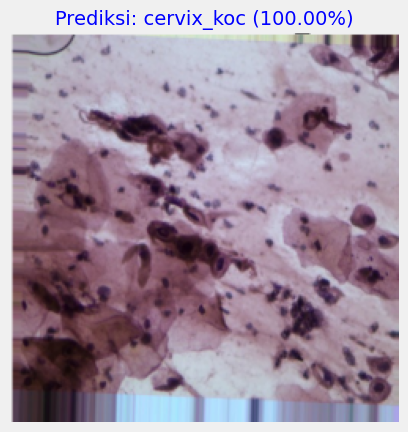

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from google.colab import files
import matplotlib.pyplot as plt
import cv2

# Daftar nama kelas (sesuaikan dengan dataset kamu)
class_names = ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']

# Fungsi prediksi + tampilkan gambar
def predict_image(model, img_path, preprocess_func):
    # Load & preprocess
    img = image.load_img(img_path, target_size=(224, 224))  # Sesuaikan ukuran
    img_array = image.img_to_array(img)
    img_array_exp = np.expand_dims(img_array, axis=0)
    img_array_exp = preprocess_func(img_array_exp)

    # Prediksi
    preds = model.predict(img_array_exp)
    pred_idx = np.argmax(preds[0])
    pred_class = class_names[pred_idx]
    confidence = preds[0][pred_idx] * 100

    # Tampilkan gambar asli + prediksi
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(f"Prediksi: {pred_class} ({confidence:.2f}%)", fontsize=14, color='blue')
    plt.show()

# Upload file & prediksi
uploaded = files.upload()
for filename in uploaded.keys():
    predict_image(model, filename, preprocess_input)  # ganti preprocess_input sesuai model


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def predict_and_visualize(model, img_path, preprocess_func, top_n=3):
    # Load image as numpy array for display
    img_pil = image.load_img(img_path, target_size=(224, 224))
    img_array_disp = np.array(img_pil)  # Untuk imshow

    # Prepare for model prediction
    img_array = image.img_to_array(img_pil)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_func(img_array)

    # Predict
    preds = model.predict(img_array)
    predicted_class = np.argmax(preds[0])
    confidence = preds[0][predicted_class] * 100

    # ---- 1. Show image + Top-1 prediction ----
    plt.imshow(img_array_disp.astype("uint8"))
    plt.axis('off')
    plt.title(f"Prediksi: {class_names[predicted_class]} ({confidence:.2f}%)")
    plt.show()

    # ---- 2. Show Top-N probabilities ----
    top_indices = preds[0].argsort()[-top_n:][::-1]
    plt.barh([class_names[i] for i in top_indices],
             [preds[0][i]*100 for i in top_indices])
    plt.xlabel("Confidence (%)")
    plt.title("Top Predictions")
    plt.show()


Saving pab.png to pab (7).png
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


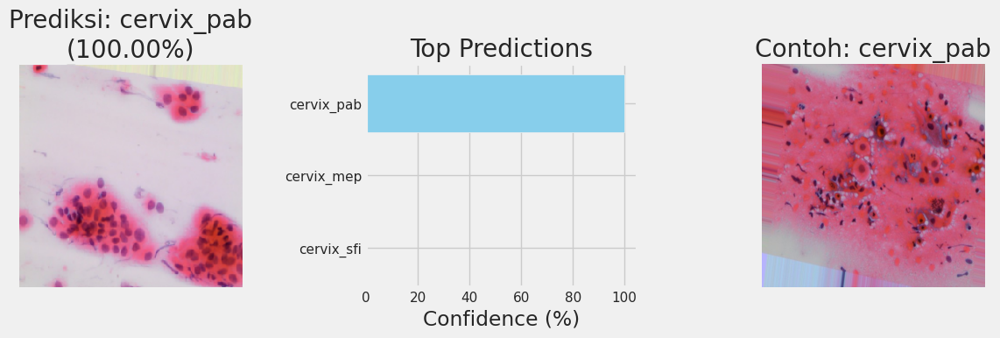

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import random
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from google.colab import files
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet50 import preprocess_input

# ======== 1. SETUP ========
# Load model
model = load_model("/content/end2A_model.keras")

# Daftar nama kelas (urutan harus sama dengan training)
class_names = ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']

# Path dataset untuk ambil contoh gambar pembanding
dataset_path = '/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer'

# ======== 2. Fungsi Prediksi ========
def predict_and_visualize(model, img_path, preprocess_func, top_n=3):
    # Load gambar untuk display
    img_pil = image.load_img(img_path, target_size=(224, 224))
    img_array_disp = np.array(img_pil)

    # Preprocess untuk model
    img_array = image.img_to_array(img_pil)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_func(img_array)

    # Prediksi
    preds = model.predict(img_array)
    predicted_class = np.argmax(preds[0])
    confidence = preds[0][predicted_class] * 100

    # ---- 1. Tampilkan gambar upload + prediksi utama ----
    plt.figure(figsize=(12,4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_array_disp.astype("uint8"))
    plt.axis('off')
    plt.title(f"Prediksi: {class_names[predicted_class]}\n({confidence:.2f}%)")

    # ---- 2. Top-N Predictions ----
    top_indices = preds[0].argsort()[-top_n:][::-1]
    plt.subplot(1, 3, 2)
    plt.barh([class_names[i] for i in top_indices],
             [preds[0][i]*100 for i in top_indices], color="skyblue")
    plt.xlabel("Confidence (%)")
    plt.title("Top Predictions")
    plt.gca().invert_yaxis()

    # ---- 3. Tampilkan contoh gambar referensi dari kelas prediksi ----
    example_images = os.listdir(os.path.join(dataset_path, class_names[predicted_class]))
    if example_images:
        example_path = os.path.join(dataset_path, class_names[predicted_class],
                                    random.choice(example_images))
        ref_img = cv2.imread(example_path)
        ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 3, 3)
        plt.imshow(ref_img)
        plt.axis('off')
        plt.title(f"Contoh: {class_names[predicted_class]}")
    else:
        plt.subplot(1, 3, 3)
        plt.text(0.5, 0.5, "No example image found", ha='center', va='center')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# ======== 3. Upload dan Prediksi ========
uploaded = files.upload()
for filename in uploaded.keys():
    predict_and_visualize(model, filename, preprocess_input, top_n=3)


Saving koc.png to koc (2).png
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


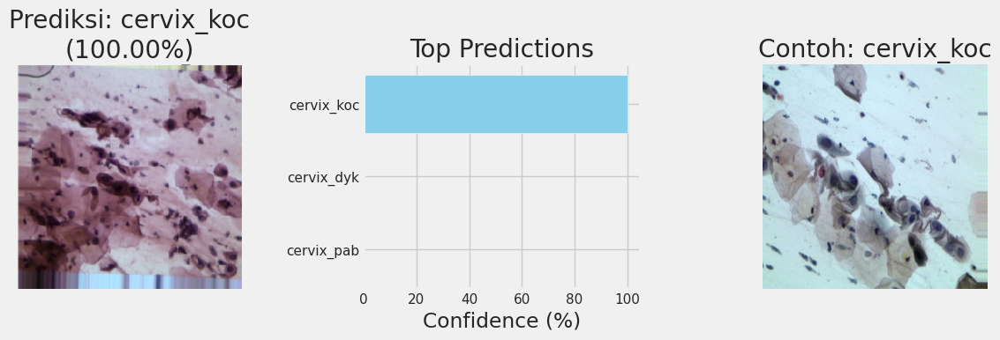

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import random
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from google.colab import files
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet50 import preprocess_input

# ======== 1. SETUP ========
# Load model
model = load_model("/content/end2A_model.keras")

# Daftar nama kelas (urutan harus sama dengan training)
class_names = ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']

# Path dataset untuk ambil contoh gambar pembanding
dataset_path = '/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer'

# ======== 2. Fungsi Prediksi ========
def predict_and_visualize(model, img_path, preprocess_func, top_n=3):
    # Load gambar untuk display
    img_pil = image.load_img(img_path, target_size=(224, 224))
    img_array_disp = np.array(img_pil)

    # Preprocess untuk model
    img_array = image.img_to_array(img_pil)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_func(img_array)

    # Prediksi
    preds = model.predict(img_array)
    predicted_class = np.argmax(preds[0])
    confidence = preds[0][predicted_class] * 100

    # ---- 1. Tampilkan gambar upload + prediksi utama ----
    plt.figure(figsize=(12,4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_array_disp.astype("uint8"))
    plt.axis('off')
    plt.title(f"Prediksi: {class_names[predicted_class]}\n({confidence:.2f}%)")

    # ---- 2. Top-N Predictions ----
    top_indices = preds[0].argsort()[-top_n:][::-1]
    plt.subplot(1, 3, 2)
    plt.barh([class_names[i] for i in top_indices],
             [preds[0][i]*100 for i in top_indices], color="skyblue")
    plt.xlabel("Confidence (%)")
    plt.title("Top Predictions")
    plt.gca().invert_yaxis()

    # ---- 3. Tampilkan contoh gambar referensi dari kelas prediksi ----
    example_images = os.listdir(os.path.join(dataset_path, class_names[predicted_class]))
    if example_images:
        example_path = os.path.join(dataset_path, class_names[predicted_class],
                                    random.choice(example_images))
        ref_img = cv2.imread(example_path)
        ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 3, 3)
        plt.imshow(ref_img)
        plt.axis('off')
        plt.title(f"Contoh: {class_names[predicted_class]}")
    else:
        plt.subplot(1, 3, 3)
        plt.text(0.5, 0.5, "No example image found", ha='center', va='center')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# ======== 3. Upload dan Prediksi ========
uploaded = files.upload()
for filename in uploaded.keys():
    predict_and_visualize(model, filename, preprocess_input, top_n=3)


Saving sfi.png to sfi.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


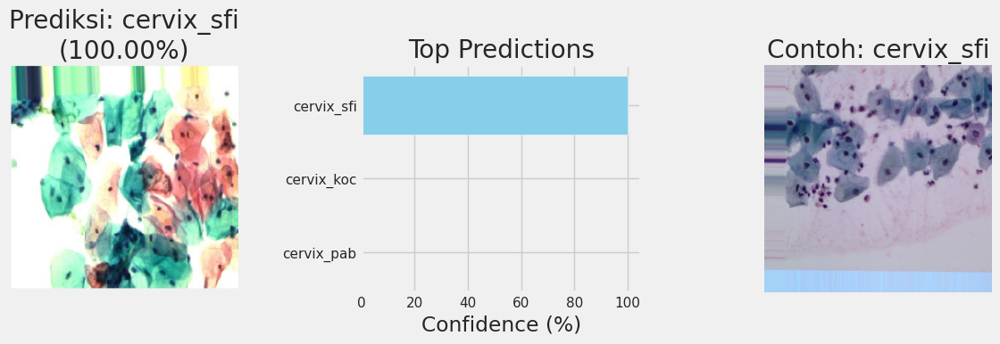

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import random
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from google.colab import files
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet50 import preprocess_input

# ======== 1. SETUP ========
# Load model
model = load_model("/content/end2A_model.keras")

# Daftar nama kelas (urutan harus sama dengan training)
class_names = ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']

# Path dataset untuk ambil contoh gambar pembanding
dataset_path = '/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer'

# ======== 2. Fungsi Prediksi ========
def predict_and_visualize(model, img_path, preprocess_func, top_n=3):
    # Load gambar untuk display
    img_pil = image.load_img(img_path, target_size=(224, 224))
    img_array_disp = np.array(img_pil)

    # Preprocess untuk model
    img_array = image.img_to_array(img_pil)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_func(img_array)

    # Prediksi
    preds = model.predict(img_array)
    predicted_class = np.argmax(preds[0])
    confidence = preds[0][predicted_class] * 100

    # ---- 1. Tampilkan gambar upload + prediksi utama ----
    plt.figure(figsize=(12,4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_array_disp.astype("uint8"))
    plt.axis('off')
    plt.title(f"Prediksi: {class_names[predicted_class]}\n({confidence:.2f}%)")

    # ---- 2. Top-N Predictions ----
    top_indices = preds[0].argsort()[-top_n:][::-1]
    plt.subplot(1, 3, 2)
    plt.barh([class_names[i] for i in top_indices],
             [preds[0][i]*100 for i in top_indices], color="skyblue")
    plt.xlabel("Confidence (%)")
    plt.title("Top Predictions")
    plt.gca().invert_yaxis()

    # ---- 3. Tampilkan contoh gambar referensi dari kelas prediksi ----
    example_images = os.listdir(os.path.join(dataset_path, class_names[predicted_class]))
    if example_images:
        example_path = os.path.join(dataset_path, class_names[predicted_class],
                                    random.choice(example_images))
        ref_img = cv2.imread(example_path)
        ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 3, 3)
        plt.imshow(ref_img)
        plt.axis('off')
        plt.title(f"Contoh: {class_names[predicted_class]}")
    else:
        plt.subplot(1, 3, 3)
        plt.text(0.5, 0.5, "No example image found", ha='center', va='center')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# ======== 3. Upload dan Prediksi ========
uploaded = files.upload()
for filename in uploaded.keys():
    predict_and_visualize(model, filename, preprocess_input, top_n=3)


Saving dyk.png to dyk.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


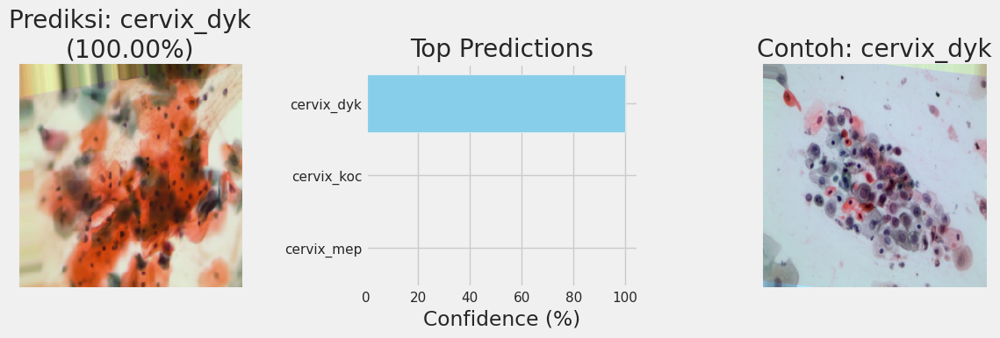

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import random
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from google.colab import files
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet50 import preprocess_input

# ======== 1. SETUP ========
# Load model
model = load_model("/content/end2A_model.keras")

# Daftar nama kelas (urutan harus sama dengan training)
class_names = ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']

# Path dataset untuk ambil contoh gambar pembanding
dataset_path = '/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer'

# ======== 2. Fungsi Prediksi ========
def predict_and_visualize(model, img_path, preprocess_func, top_n=3):
    # Load gambar untuk display
    img_pil = image.load_img(img_path, target_size=(224, 224))
    img_array_disp = np.array(img_pil)

    # Preprocess untuk model
    img_array = image.img_to_array(img_pil)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_func(img_array)

    # Prediksi
    preds = model.predict(img_array)
    predicted_class = np.argmax(preds[0])
    confidence = preds[0][predicted_class] * 100

    # ---- 1. Tampilkan gambar upload + prediksi utama ----
    plt.figure(figsize=(12,4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_array_disp.astype("uint8"))
    plt.axis('off')
    plt.title(f"Prediksi: {class_names[predicted_class]}\n({confidence:.2f}%)")

    # ---- 2. Top-N Predictions ----
    top_indices = preds[0].argsort()[-top_n:][::-1]
    plt.subplot(1, 3, 2)
    plt.barh([class_names[i] for i in top_indices],
             [preds[0][i]*100 for i in top_indices], color="skyblue")
    plt.xlabel("Confidence (%)")
    plt.title("Top Predictions")
    plt.gca().invert_yaxis()

    # ---- 3. Tampilkan contoh gambar referensi dari kelas prediksi ----
    example_images = os.listdir(os.path.join(dataset_path, class_names[predicted_class]))
    if example_images:
        example_path = os.path.join(dataset_path, class_names[predicted_class],
                                    random.choice(example_images))
        ref_img = cv2.imread(example_path)
        ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 3, 3)
        plt.imshow(ref_img)
        plt.axis('off')
        plt.title(f"Contoh: {class_names[predicted_class]}")
    else:
        plt.subplot(1, 3, 3)
        plt.text(0.5, 0.5, "No example image found", ha='center', va='center')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# ======== 3. Upload dan Prediksi ========
uploaded = files.upload()
for filename in uploaded.keys():
    predict_and_visualize(model, filename, preprocess_input, top_n=3)


Saving dyk2.png to dyk2.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


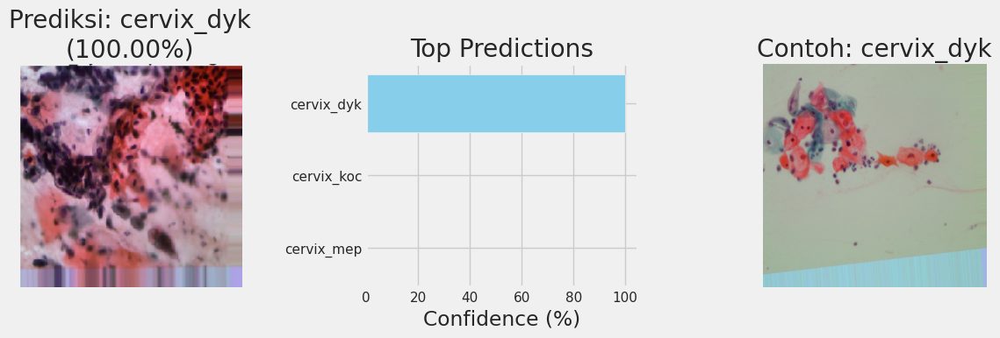

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import random
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from google.colab import files
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet50 import preprocess_input

# ======== 1. SETUP ========
# Load model
model = load_model("/content/end2A_model.keras")

# Daftar nama kelas (urutan harus sama dengan training)
class_names = ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']

# Path dataset untuk ambil contoh gambar pembanding
dataset_path = '/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer'

# ======== 2. Fungsi Prediksi ========
def predict_and_visualize(model, img_path, preprocess_func, top_n=3):
    # Load gambar untuk display
    img_pil = image.load_img(img_path, target_size=(224, 224))
    img_array_disp = np.array(img_pil)

    # Preprocess untuk model
    img_array = image.img_to_array(img_pil)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_func(img_array)

    # Prediksi
    preds = model.predict(img_array)
    predicted_class = np.argmax(preds[0])
    confidence = preds[0][predicted_class] * 100

    # ---- 1. Tampilkan gambar upload + prediksi utama ----
    plt.figure(figsize=(12,4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_array_disp.astype("uint8"))
    plt.axis('off')
    plt.title(f"Prediksi: {class_names[predicted_class]}\n({confidence:.2f}%)")

    # ---- 2. Top-N Predictions ----
    top_indices = preds[0].argsort()[-top_n:][::-1]
    plt.subplot(1, 3, 2)
    plt.barh([class_names[i] for i in top_indices],
             [preds[0][i]*100 for i in top_indices], color="skyblue")
    plt.xlabel("Confidence (%)")
    plt.title("Top Predictions")
    plt.gca().invert_yaxis()

    # ---- 3. Tampilkan contoh gambar referensi dari kelas prediksi ----
    example_images = os.listdir(os.path.join(dataset_path, class_names[predicted_class]))
    if example_images:
        example_path = os.path.join(dataset_path, class_names[predicted_class],
                                    random.choice(example_images))
        ref_img = cv2.imread(example_path)
        ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 3, 3)
        plt.imshow(ref_img)
        plt.axis('off')
        plt.title(f"Contoh: {class_names[predicted_class]}")
    else:
        plt.subplot(1, 3, 3)
        plt.text(0.5, 0.5, "No example image found", ha='center', va='center')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# ======== 3. Upload dan Prediksi ========
uploaded = files.upload()
for filename in uploaded.keys():
    predict_and_visualize(model, filename, preprocess_input, top_n=3)


Saving mep.png to mep.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


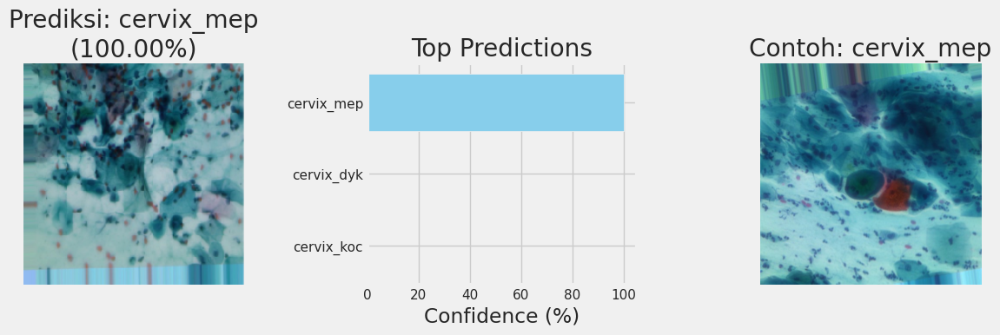

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import random
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from google.colab import files
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet50 import preprocess_input

# ======== 1. SETUP ========
# Load model
model = load_model("/content/end2A_model.keras")

# Daftar nama kelas (urutan harus sama dengan training)
class_names = ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']

# Path dataset untuk ambil contoh gambar pembanding
dataset_path = '/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer'

# ======== 2. Fungsi Prediksi ========
def predict_and_visualize(model, img_path, preprocess_func, top_n=3):
    # Load gambar untuk display
    img_pil = image.load_img(img_path, target_size=(224, 224))
    img_array_disp = np.array(img_pil)

    # Preprocess untuk model
    img_array = image.img_to_array(img_pil)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_func(img_array)

    # Prediksi
    preds = model.predict(img_array)
    predicted_class = np.argmax(preds[0])
    confidence = preds[0][predicted_class] * 100

    # ---- 1. Tampilkan gambar upload + prediksi utama ----
    plt.figure(figsize=(12,4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_array_disp.astype("uint8"))
    plt.axis('off')
    plt.title(f"Prediksi: {class_names[predicted_class]}\n({confidence:.2f}%)")

    # ---- 2. Top-N Predictions ----
    top_indices = preds[0].argsort()[-top_n:][::-1]
    plt.subplot(1, 3, 2)
    plt.barh([class_names[i] for i in top_indices],
             [preds[0][i]*100 for i in top_indices], color="skyblue")
    plt.xlabel("Confidence (%)")
    plt.title("Top Predictions")
    plt.gca().invert_yaxis()

    # ---- 3. Tampilkan contoh gambar referensi dari kelas prediksi ----
    example_images = os.listdir(os.path.join(dataset_path, class_names[predicted_class]))
    if example_images:
        example_path = os.path.join(dataset_path, class_names[predicted_class],
                                    random.choice(example_images))
        ref_img = cv2.imread(example_path)
        ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 3, 3)
        plt.imshow(ref_img)
        plt.axis('off')
        plt.title(f"Contoh: {class_names[predicted_class]}")
    else:
        plt.subplot(1, 3, 3)
        plt.text(0.5, 0.5, "No example image found", ha='center', va='center')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# ======== 3. Upload dan Prediksi ========
uploaded = files.upload()
for filename in uploaded.keys():
    predict_and_visualize(model, filename, preprocess_input, top_n=3)


**--------------------------------------------------------------------------------------------------------------------------------**

# **ResNet50**

In [ ]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = False

model3 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(256, activation='relu'),
    Dropout(0.25),
    Dense(64, activation='relu'),
    Dropout(0.25),
    Dense(5, activation='softmax')
])

optimizer = Adamax(learning_rate=0.002)
model3.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])



In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

model_checkpoint = ModelCheckpoint(
    'end250_model.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

history = model3.fit(
     train_gen,
     epochs=50,
     validation_data=valid_gen,
     shuffle=False,
     callbacks=[early_stopping, model_checkpoint],
     validation_steps=None
)

model3.save("endstar250_model.keras")
from google.colab import drive
drive.mount('/content/drive')

import shutil
shutil.copy("end250_model.keras", "/content/drive/MyDrive/end250_model.keras")
shutil.copy("endstar250_model.keras", "/content/drive/MyDrive/endstar250_model.keras")

import pickle
with open("history.pkl", "wb") as f:
    pickle.dump(history.history, f)


Epoch 1/50
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 540ms/step - accuracy: 0.5465 - loss: 5.9753
Epoch 1: val_loss improved from inf to 0.43835, saving model to end250_model.keras
274/274 ━━━━━━━━━━━━━━━━━━━━ 208s 710ms/step - accuracy: 0.5468 - loss: 5.9621 - val_accuracy: 0.8560 - val_loss: 0.4383
Epoch 2/50
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step - accuracy: 0.8189 - loss: 0.5497
Epoch 2: val_loss improved from 0.43835 to 0.14726, saving model to end250_model.keras
274/274 ━━━━━━━━━━━━━━━━━━━━ 111s 404ms/step - accuracy: 0.8190 - loss: 0.5494 - val_accuracy: 0.9445 - val_loss: 0.1473
Epoch 3/50
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.9183 - loss: 0.2504
Epoch 3: val_loss improved from 0.14726 to 0.06522, saving model to end250_model.keras
274/274 ━━━━━━━━━━━━━━━━━━━━ 105s 382ms/step - accuracy: 0.9184 - loss: 0.2503 - val_accuracy: 0.9792 - val_loss: 0.0652
Epoch 4/50
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - accuracy: 0.9489 - loss: 0.1589
Epoch 4: val_loss improved f

In [ ]:
# Tambah
from tensorflow.keras.models import load_model

# Load model terbaik dari file
model = load_model('end250_model.keras')
print(model.summary())


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 100,709,137 (384.17 MB)

 Trainable params: 25,707,141 (98.06 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

 Optimizer params: 51,414,284 (196.13 MB)

None


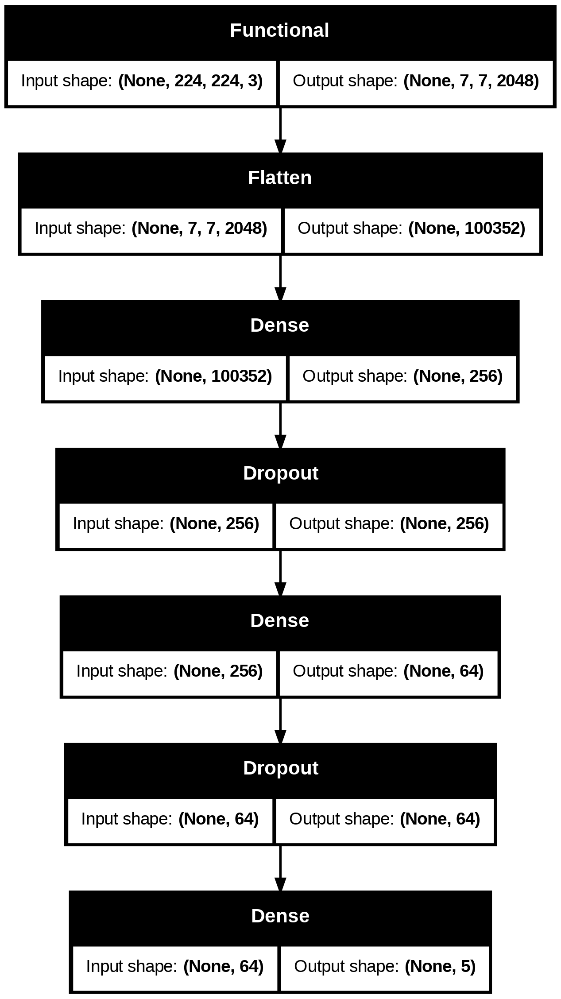

In [ ]:
tf.keras.utils.plot_model(model3,show_shapes=True)

In [ ]:
best_model = load_model('end250_model.keras')

test_loss, test_accuracy = best_model.evaluate(test_gen, verbose=2)

print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')

59/59 - 41s - 690ms/step - accuracy: 0.9968 - loss: 0.0088
Test Loss: 0.0088
Test Accuracy: 0.9968


In [ ]:
test_loss, test_accuracy = model3.evaluate(test_gen)
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.2f}')

59/59 ━━━━━━━━━━━━━━━━━━━━ 17s 290ms/step - accuracy: 0.9965 - loss: 0.0087
Test Loss: 0.0088
Test Accuracy: 1.00


59/59 ━━━━━━━━━━━━━━━━━━━━ 17s 287ms/step


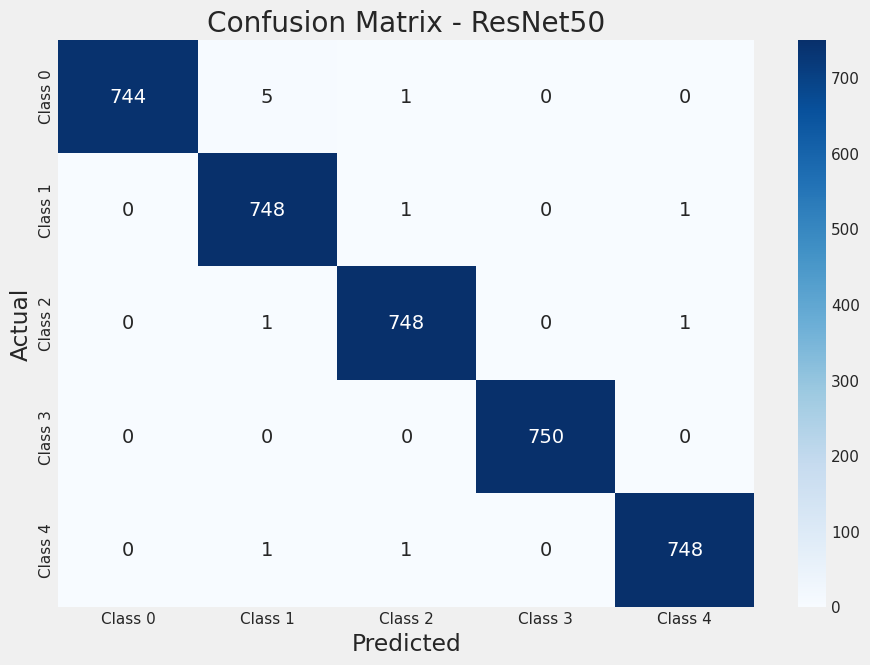

              precision    recall  f1-score   support

     Class 0       1.00      0.99      1.00       750
     Class 1       0.99      1.00      0.99       750
     Class 2       1.00      1.00      1.00       750
     Class 3       1.00      1.00      1.00       750
     Class 4       1.00      1.00      1.00       750

    accuracy                           1.00      3750
   macro avg       1.00      1.00      1.00      3750
weighted avg       1.00      1.00      1.00      3750



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report


y_pred_prob_resnet = model3.predict(test_gen)
y_pred_classes_resnet = np.argmax(y_pred_prob_resnet, axis=1)

y_true = test_gen.classes

# Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes_resnet)
labels = [f"Class {i}" for i in range(5)]
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix - ResNet50')
plt.show()

# Classification report
class_report = classification_report(y_true, y_pred_classes_resnet, target_names=labels)
print(class_report)



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from tensorflow.keras.applications import ResNet50, EfficientNetB0, DenseNet121, VGG19
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

# --- Define models ---
def build_resnet(input_shape=(224,224,3), num_classes=5):
    base = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    base.trainable = False
    model = Sequential([
        base,
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.25),
        Dense(64, activation='relu'),
        Dropout(0.25),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

def build_efficientnet(input_shape=(224,224,3), num_classes=5):
    from tensorflow.keras.applications import EfficientNetB0
    base = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)
    base.trainable = False
    model = Sequential([
        base,
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.25),
        Dense(64, activation='relu'),
        Dropout(0.25),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

def build_densenet(input_shape=(224,224,3), num_classes=5):
    from tensorflow.keras.applications import DenseNet121
    base = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)
    base.trainable = False
    model = Sequential([
        base,
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.25),
        Dense(64, activation='relu'),
        Dropout(0.25),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

def build_vgg19(input_shape=(224,224,3), num_classes=5):
    from tensorflow.keras.applications import VGG19
    base = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)
    base.trainable = False
    model = Sequential([
        base,
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.25),
        Dense(64, activation='relu'),
        Dropout(0.25),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# --- Prepare model list ---
models = [build_resnet(), build_efficientnet(), build_densenet(), build_vgg19()]
names = ['ResNet50', 'EfficientNetB0', 'DenseNet121', 'VGG19']

# --- Define training function ---
def training_dl(model, train_gen, valid_gen):
    history = model.fit(train_gen, validation_data=valid_gen, epochs=30)  # sesuaikan epoch
    y_true_indices = valid_gen.classes
    y_pred_prob = model.predict(valid_gen)
    y_pred_indices = np.argmax(y_pred_prob, axis=1)

    # Convert indices to class names
    class_names = list(valid_gen.class_indices.keys())
    y_true_names = [class_names[i] for i in y_true_indices]
    y_pred_names = [class_names[i] for i in y_pred_indices]

    score = accuracy_score(y_true_names, y_pred_names)
    report = classification_report(y_true_names, y_pred_names)
    cm = confusion_matrix(y_true_names, y_pred_names)

    return score, report, cm

# --- Run training & evaluation ---
scores, reports, cms = [], dict(), dict()
for m, n in zip(models, names):
    score, report, cm = training_dl(m, train_gen, valid_gen)
    scores.append(score)
    reports[n] = report
    cms[n] = cm

# --- Visualisasi akurasi ---
dd = pd.DataFrame({"scores": scores}, index=names).sort_values("scores", ascending=False)
dd["scores"] = round(dd["scores"], 2)

fig, ax = plt.subplots()
sns.barplot(x=dd.index, y=dd.scores, ax=ax)
for container in ax.containers:
    ax.bar_label(container)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.set_ylabel("Accuracy")
ax.set_title("Comparison of DL Model Accuracies")
plt.show()

# --- Optional: tampilkan confusion matrix ---
for n in names:
    plt.figure(figsize=(8,6))
    # Use sorted unique class names for consistent plotting
    class_names = sorted(list(valid_gen.class_indices.keys()))
    sns.heatmap(cms[n], annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix - {n}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# --- Optional: print classification report ---
for n in names:
    print(f"Classification Report - {n}:\n{reports[n]}\n")

Epoch 1/30
274/274 ━━━━━━━━━━━━━━━━━━━━ 173s 584ms/step - accuracy: 0.7049 - loss: 3.6977 - val_accuracy: 0.9597 - val_loss: 0.1251
Epoch 2/30
274/274 ━━━━━━━━━━━━━━━━━━━━ 147s 535ms/step - accuracy: 0.9227 - loss: 0.3127 - val_accuracy: 0.9800 - val_loss: 0.0641
Epoch 3/30
110/274 ━━━━━━━━━━━━━━━━━━━━ 1:09 421ms/step - accuracy: 0.9557 - loss: 0.1698

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


59/59 ━━━━━━━━━━━━━━━━━━━━ 19s 317ms/step
Accuracy: 0.9973333333333333
              precision    recall  f1-score   support

  cervix_dyk       1.00      1.00      1.00       750
  cervix_koc       1.00      0.99      0.99       750
  cervix_mep       1.00      1.00      1.00       750
  cervix_pab       1.00      1.00      1.00       750
  cervix_sfi       0.99      1.00      0.99       750

    accuracy                           1.00      3750
   macro avg       1.00      1.00      1.00      3750
weighted avg       1.00      1.00      1.00      3750



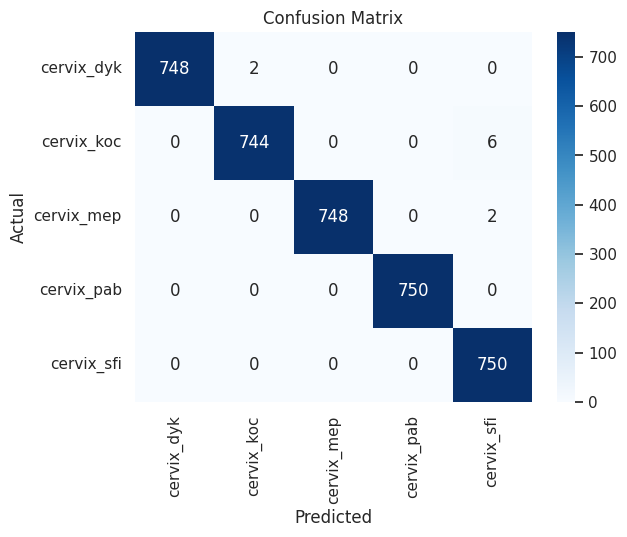

False Negatives for cervix_koc: 6


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 7️⃣ Evaluasi model (Accuracy, Confusion Matrix, False Negative) ---
y_true = test_gen.classes # Use test_gen for evaluation
y_pred_prob = model.predict(test_gen)
y_pred = np.argmax(y_pred_prob, axis=1)

class_names = list(test_gen.class_indices.keys())
y_true_names = [class_names[i] for i in y_true]
y_pred_names = [class_names[i] for i in y_pred]

# Accuracy
acc = accuracy_score(y_true_names, y_pred_names)
print("Accuracy:", acc)

# Classification report
print(classification_report(y_true_names, y_pred_names))

# Confusion matrix
cm = confusion_matrix(y_true_names, y_pred_names)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# False negatives (misclassification positif jadi negatif)
# Assuming the order of class names in test_gen.class_indices is consistent
# and you want to calculate false negatives for a specific class, e.g., 'cervix_koc'
# You might need to adjust the index based on your class_names list
try:
    koc_index = class_names.index('cervix_koc')
    false_negatives_koc = cm[koc_index].sum() - cm[koc_index][koc_index]
    print("False Negatives for cervix_koc:", false_negatives_koc)
except ValueError:
    print("'cervix_koc' not found in class names.")

59/59 ━━━━━━━━━━━━━━━━━━━━ 20s 334ms/step
Accuracy: 0.9973333333333333
              precision    recall  f1-score   support

  cervix_dyk       1.00      1.00      1.00       750
  cervix_koc       1.00      0.99      0.99       750
  cervix_mep       1.00      1.00      1.00       750
  cervix_pab       1.00      1.00      1.00       750
  cervix_sfi       0.99      1.00      0.99       750

    accuracy                           1.00      3750
   macro avg       1.00      1.00      1.00      3750
weighted avg       1.00      1.00      1.00      3750



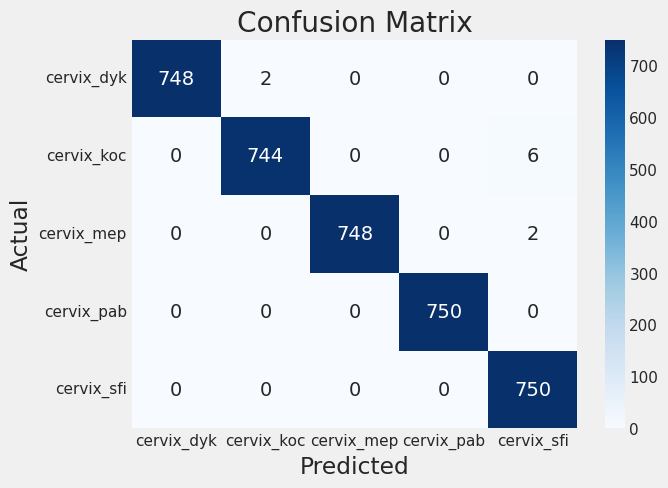

False Negatives for cervix_mep: 2


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 7️⃣ Evaluasi model (Accuracy, Confusion Matrix, False Negative) ---
y_true = test_gen.classes # Use test_gen for evaluation
y_pred_prob = model.predict(test_gen)
y_pred = np.argmax(y_pred_prob, axis=1)

class_names = list(test_gen.class_indices.keys())
y_true_names = [class_names[i] for i in y_true]
y_pred_names = [class_names[i] for i in y_pred]

# Accuracy
acc = accuracy_score(y_true_names, y_pred_names)
print("Accuracy:", acc)

# Classification report
print(classification_report(y_true_names, y_pred_names))

# Confusion matrix
cm = confusion_matrix(y_true_names, y_pred_names)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# False negatives (misclassification positif jadi negatif)
# Assuming the order of class names in test_gen.class_indices is consistent
# and you want to calculate false negatives for a specific class, e.g., 'cervix_koc'
# You might need to adjust the index based on your class_names list
try:
    koc_index = class_names.index('cervix_mep')
    false_negatives_koc = cm[koc_index].sum() - cm[koc_index][koc_index]
    print("False Negatives for cervix_mep:", false_negatives_koc)
except ValueError:
    print("'cervix_koc' not found in class names.")

59/59 ━━━━━━━━━━━━━━━━━━━━ 24s 403ms/step
Accuracy: 0.9973333333333333
              precision    recall  f1-score   support

  cervix_dyk       1.00      1.00      1.00       750
  cervix_koc       1.00      0.99      0.99       750
  cervix_mep       1.00      1.00      1.00       750
  cervix_pab       1.00      1.00      1.00       750
  cervix_sfi       0.99      1.00      0.99       750

    accuracy                           1.00      3750
   macro avg       1.00      1.00      1.00      3750
weighted avg       1.00      1.00      1.00      3750



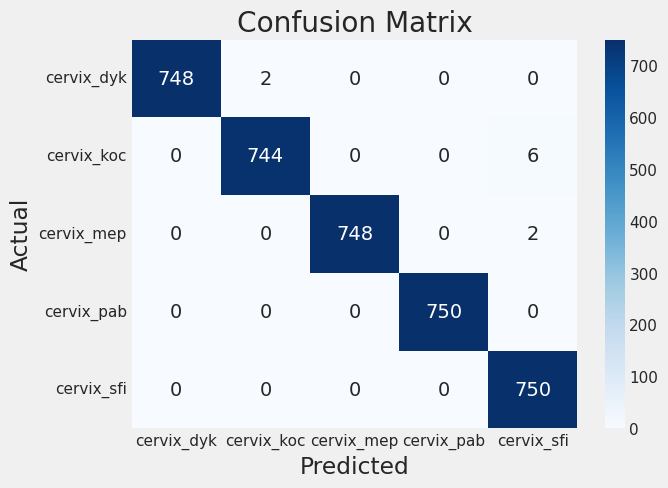

False Negatives for cervix_koc: 2


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 7️⃣ Evaluasi model (Accuracy, Confusion Matrix, False Negative) ---
y_true = test_gen.classes # Use test_gen for evaluation
y_pred_prob = model.predict(test_gen)
y_pred = np.argmax(y_pred_prob, axis=1)

class_names = list(test_gen.class_indices.keys())
y_true_names = [class_names[i] for i in y_true]
y_pred_names = [class_names[i] for i in y_pred]

# Accuracy
acc = accuracy_score(y_true_names, y_pred_names)
print("Accuracy:", acc)

# Classification report
print(classification_report(y_true_names, y_pred_names))

# Confusion matrix
cm = confusion_matrix(y_true_names, y_pred_names)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# False negatives (misclassification positif jadi negatif)
# Assuming the order of class names in test_gen.class_indices is consistent
# and you want to calculate false negatives for a specific class, e.g., 'cervix_koc'
# You might need to adjust the index based on your class_names list
try:
    koc_index = class_names.index('cervix_dyk')
    false_negatives_koc = cm[koc_index].sum() - cm[koc_index][koc_index]
    print("False Negatives for cervix_dyk:", false_negatives_koc)
except ValueError:
    print("'cervix_koc' not found in class names.")

59/59 ━━━━━━━━━━━━━━━━━━━━ 19s 325ms/step
Accuracy: 0.9973333333333333
              precision    recall  f1-score   support

  cervix_dyk       1.00      1.00      1.00       750
  cervix_koc       1.00      0.99      0.99       750
  cervix_mep       1.00      1.00      1.00       750
  cervix_pab       1.00      1.00      1.00       750
  cervix_sfi       0.99      1.00      0.99       750

    accuracy                           1.00      3750
   macro avg       1.00      1.00      1.00      3750
weighted avg       1.00      1.00      1.00      3750



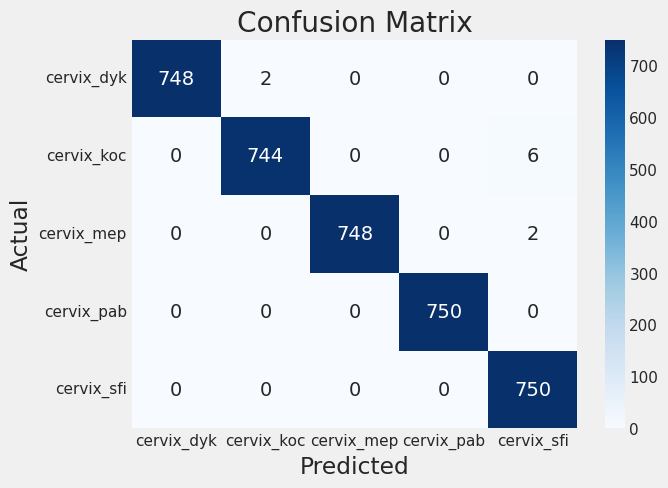

False Negatives for cervix_sfi: 0


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 7️⃣ Evaluasi model (Accuracy, Confusion Matrix, False Negative) ---
y_true = test_gen.classes # Use test_gen for evaluation
y_pred_prob = model.predict(test_gen)
y_pred = np.argmax(y_pred_prob, axis=1)

class_names = list(test_gen.class_indices.keys())
y_true_names = [class_names[i] for i in y_true]
y_pred_names = [class_names[i] for i in y_pred]

# Accuracy
acc = accuracy_score(y_true_names, y_pred_names)
print("Accuracy:", acc)

# Classification report
print(classification_report(y_true_names, y_pred_names))

# Confusion matrix
cm = confusion_matrix(y_true_names, y_pred_names)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# False negatives (misclassification positif jadi negatif)
# Assuming the order of class names in test_gen.class_indices is consistent
# and you want to calculate false negatives for a specific class, e.g., 'cervix_koc'
# You might need to adjust the index based on your class_names list
try:
    koc_index = class_names.index('cervix_sfi')
    false_negatives_koc = cm[koc_index].sum() - cm[koc_index][koc_index]
    print("False Negatives for cervix_sfi:", false_negatives_koc)
except ValueError:
    print("'cervix_koc' not found in class names.")

59/59 ━━━━━━━━━━━━━━━━━━━━ 20s 335ms/step
Accuracy: 0.9973333333333333
              precision    recall  f1-score   support

  cervix_dyk       1.00      1.00      1.00       750
  cervix_koc       1.00      0.99      0.99       750
  cervix_mep       1.00      1.00      1.00       750
  cervix_pab       1.00      1.00      1.00       750
  cervix_sfi       0.99      1.00      0.99       750

    accuracy                           1.00      3750
   macro avg       1.00      1.00      1.00      3750
weighted avg       1.00      1.00      1.00      3750



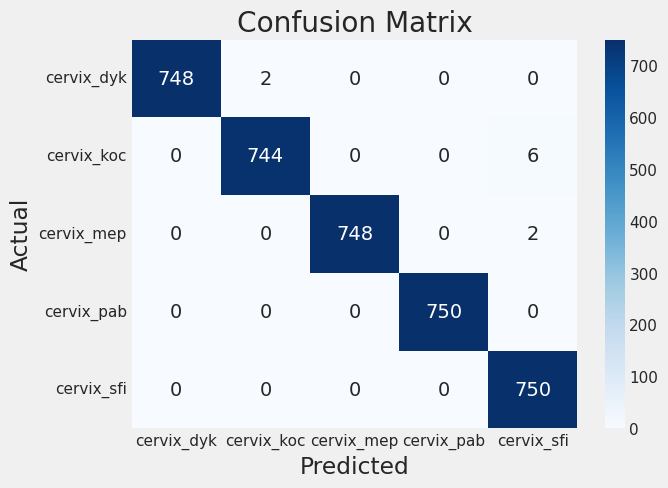

False Negatives for cervix_pab: 0


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 7️⃣ Evaluasi model (Accuracy, Confusion Matrix, False Negative) ---
y_true = test_gen.classes # Use test_gen for evaluation
y_pred_prob = model.predict(test_gen)
y_pred = np.argmax(y_pred_prob, axis=1)

class_names = list(test_gen.class_indices.keys())
y_true_names = [class_names[i] for i in y_true]
y_pred_names = [class_names[i] for i in y_pred]

# Accuracy
acc = accuracy_score(y_true_names, y_pred_names)
print("Accuracy:", acc)

# Classification report
print(classification_report(y_true_names, y_pred_names))

# Confusion matrix
cm = confusion_matrix(y_true_names, y_pred_names)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# False negatives (misclassification positif jadi negatif)
# Assuming the order of class names in test_gen.class_indices is consistent
# and you want to calculate false negatives for a specific class, e.g., 'cervix_koc'
# You might need to adjust the index based on your class_names list
try:
    koc_index = class_names.index('cervix_pab')
    false_negatives_koc = cm[koc_index].sum() - cm[koc_index][koc_index]
    print("False Negatives for cervix_pab:", false_negatives_koc)
except ValueError:
    print("'cervix_koc' not found in class names.")

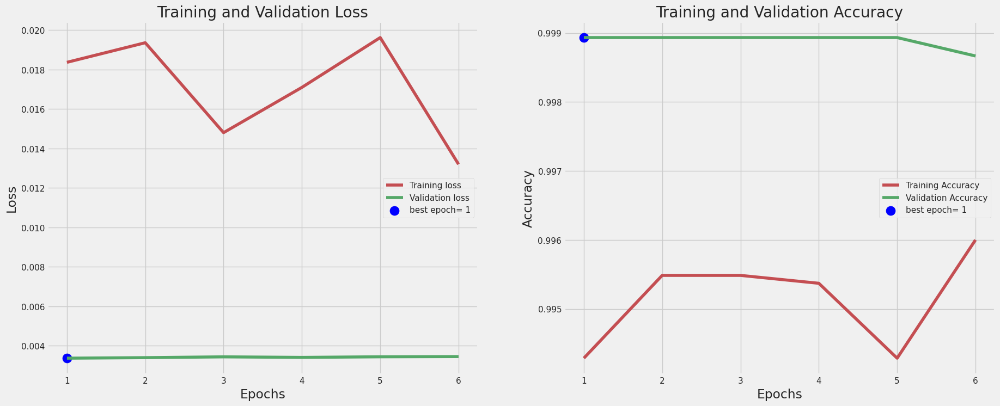

In [ ]:
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]

Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [ ]:
model.save("Cervical Cancer End2A-FT.h5")